# Assignment - Denoising Diffusion Implicit Models

DDIM is Deterministic compared to DDPM which is stochastic

DDIM samples faster

In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
import math
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds

2024-12-03 16:57:20.520764: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-03 16:57:20.520813: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-03 16:57:20.522928: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-03 16:57:20.538656: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 16:57:23.463002: W tensorflow/comp

In [3]:
gpus = tf.config.experimental.list_physical_devices("GPU")
if gpus:
    try:
        # Restrict TensorFlow to only use the first GPU
        tf.config.experimental.set_visible_devices(gpus[0], "GPU")

        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices("GPU")
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

4 Physical GPUs, 1 Logical GPUs


2024-12-03 16:57:28.963016: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14784 MB memory:  -> device: 0, name: Tesla V100-PCIE-16GB, pci bus id: 0000:3b:00.0, compute capability: 7.0


In [4]:
# Feel free to change these parameters according to your system's configuration
# data
dataset_name = "oxford_flowers102"
dataset_repetitions = 5
num_epochs = 10
image_size = 64
shuffle_times = 10

# KID = Kernel Inception Distance, see related section
kid_image_size = 75
kid_diffusion_steps = 5
plot_diffusion_steps = 20

# sampling
min_signal_rate = 0.02
max_signal_rate = 0.95

# architecture
embedding_dims = 32
embedding_max_frequency = 1000.0
widths = [32, 64, 96, 128]
block_depth = 2

# optimization
batch_size = 128
ema = 0.999
learning_rate = 1e-3
weight_decay = 1e-4

# Data pipeline

In [5]:
def preprocess_image(data):
    # center crop image
    height = tf.shape(data["image"])[0]
    width = tf.shape(data["image"])[1]
    crop_size = tf.minimum(height, width)
    image = tf.image.crop_to_bounding_box(
        data["image"],
        (height - crop_size) // 2,
        (width - crop_size) // 2,
        crop_size,
        crop_size,
    )
    image = tf.image.random_flip_left_right(image)

    # resize and clip
    # for image downsampling it is important to turn on antialiasing
    image = tf.image.resize(
        image, size=[image_size, image_size], antialias=True
    )
    return tf.clip_by_value(image / 255.0, 0.0, 1.0)


def prepare_dataset(split):
    # the validation dataset is shuffled as well, because data order matters
    # for the KID estimation
    return (
        tfds.load(dataset_name, split=split, shuffle_files=True)
        .map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
        .cache()
        .repeat(dataset_repetitions)
        .shuffle(shuffle_times * batch_size)
        .batch(batch_size, drop_remainder=True)
        .prefetch(buffer_size=tf.data.AUTOTUNE)
    )


# Load individual datasets
train_part = prepare_dataset("train")
validation_part = prepare_dataset("validation")
test_part = prepare_dataset("test")

# Concatenate all parts into one training dataset
train_dataset = train_part.concatenate(test_part)
val_dataset = validation_part

# Kernel inception distance

In [6]:
class KID(keras.metrics.Metric):
    def __init__(self, name, **kwargs):
        super().__init__(name=name, **kwargs)

        # KID is estimated per batch and is averaged across batches
        self.kid_tracker = keras.metrics.Mean(name="kid_tracker")

        # a pretrained InceptionV3 is used without its classification layer
        # transform the pixel values to the 0-255 range, then use the same
        # preprocessing as during pretraining
        self.encoder = keras.Sequential(
            [
                keras.Input(shape=(image_size, image_size, 3)),
                layers.Rescaling(255.0),
                layers.Resizing(height=kid_image_size, width=kid_image_size),
                layers.Lambda(
                    keras.applications.inception_v3.preprocess_input
                ),
                keras.applications.InceptionV3(
                    include_top=False,
                    input_shape=(kid_image_size, kid_image_size, 3),
                    weights="imagenet",
                ),
                layers.GlobalAveragePooling2D(),
            ],
            name="inception_encoder",
        )

    def polynomial_kernel(self, features_1, features_2):
        # Use TensorFlow functions instead of ops
        feature_dimensions = tf.cast(tf.shape(features_1)[1], dtype="float32")
        return (
            tf.matmul(features_1, tf.transpose(features_2))
            / feature_dimensions
            + 1.0
        ) ** 3.0

    def update_state(self, real_images, generated_images, sample_weight=None):
        real_features = self.encoder(real_images, training=False)
        generated_features = self.encoder(generated_images, training=False)

        # compute polynomial kernels using the two sets of features
        kernel_real = self.polynomial_kernel(real_features, real_features)
        kernel_generated = self.polynomial_kernel(
            generated_features, generated_features
        )
        kernel_cross = self.polynomial_kernel(
            real_features, generated_features
        )

        # estimate the squared maximum mean discrepancy using the average kernel values
        batch_size = tf.shape(real_features)[0]
        batch_size_f = tf.cast(batch_size, dtype="float32")
        mean_kernel_real = tf.reduce_sum(
            kernel_real * (1.0 - tf.eye(batch_size))
        ) / (batch_size_f * (batch_size_f - 1.0))
        mean_kernel_generated = tf.reduce_sum(
            kernel_generated * (1.0 - tf.eye(batch_size))
        ) / (batch_size_f * (batch_size_f - 1.0))
        mean_kernel_cross = tf.reduce_mean(kernel_cross)
        kid = (
            mean_kernel_real + mean_kernel_generated - 2.0 * mean_kernel_cross
        )

        # update the average KID estimate
        self.kid_tracker.update_state(kid)

    def result(self):
        return self.kid_tracker.result()

    def reset_state(self):
        self.kid_tracker.reset_state()

# Network architecture

In [7]:
def sinusoidal_embedding(x):
    embedding_min_frequency = 1.0
    frequencies = tf.math.exp(
        tf.linspace(
            tf.math.log(embedding_min_frequency),
            tf.math.log(embedding_max_frequency),
            embedding_dims // 2,
        )
    )
    angular_speeds = tf.cast(2.0 * math.pi * frequencies, "float32")
    embeddings = tf.concat(
        [tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
    )
    return embeddings


def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width:
            residual = x
        else:
            residual = layers.Conv2D(width, kernel_size=1)(x)
        x = layers.BatchNormalization(center=False, scale=False)(x)
        x = layers.Conv2D(
            width, kernel_size=3, padding="same", activation="swish"
        )(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = layers.Add()([x, residual])
        return x

    return apply


def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x)
            skips.append(x)
        x = layers.AveragePooling2D(pool_size=2)(x)
        return x

    return apply


def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = layers.UpSampling2D(size=2, interpolation="bilinear")(x)
        for _ in range(block_depth):
            x = layers.Concatenate()([x, skips.pop()])
            x = ResidualBlock(width)(x)
        return x

    return apply


def get_network(image_size, widths, block_depth):
    noisy_images = keras.Input(shape=(image_size, image_size, 3))
    noise_variances = keras.Input(shape=(1, 1, 1))

    e = layers.Lambda(sinusoidal_embedding, output_shape=(1, 1, 32))(
        noise_variances
    )
    e = layers.UpSampling2D(size=image_size, interpolation="nearest")(e)

    x = layers.Conv2D(widths[0], kernel_size=1)(noisy_images)
    x = layers.Concatenate()([x, e])

    skips = []
    for width in widths[:-1]:
        x = DownBlock(width, block_depth)([x, skips])

    for _ in range(block_depth):
        x = ResidualBlock(widths[-1])(x)

    for width in reversed(widths[:-1]):
        x = UpBlock(width, block_depth)([x, skips])

    x = layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x)

    return keras.Model(
        [noisy_images, noise_variances], x, name="residual_unet"
    )

# Diffusion model

In [8]:
class DiffusionModel(keras.Model):
    def __init__(self, image_size, widths, block_depth):
        super().__init__()

        self.normalizer = layers.Normalization()
        self.network = get_network(image_size, widths, block_depth)
        self.ema_network = keras.models.clone_model(self.network)

    def compile(self, **kwargs):
        super().compile(**kwargs)

        self.noise_loss_tracker = keras.metrics.Mean(name="n_loss")
        self.image_loss_tracker = keras.metrics.Mean(name="i_loss")
        self.kid = KID(name="kid")

    @property
    def metrics(self):
        return [self.noise_loss_tracker, self.image_loss_tracker, self.kid]

    def denormalize(self, images):
        # convert the pixel values back to 0-1 range
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return tf.clip_by_value(images, 0.0, 1.0)

    def diffusion_schedule(self, diffusion_times):
        # TODO: check if the diffusion_times are in the range [0, 1]
        # diffusion_times should be between 0 and 1, corresponding to the start and end of the diffusion process
        diffusion_times = tf.clip_by_value(diffusion_times, 0.0, 1.0)
        max_angle = tf.acos(min_signal_rate)
        min_angle = tf.acos(max_signal_rate)

        # angles -> signal and noise rates
        # Use cosine and sine functions to calculate the signal and noise rates based on angles
        diffusion_angles = (
            diffusion_times * (max_angle - min_angle) + min_angle
        )
        noise_rates, signal_rates = (
            tf.sin(diffusion_angles),
            tf.cos(diffusion_angles),
        )  # calculate the noise and signal rates
        # note that their squared sum is always: sin^2(x) + cos^2(x) = 1

        return noise_rates, signal_rates

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        # TODO: implement the denoising network
        # Use the model (self.network or self.ema_network) to predict the noise component in the images

        # Predict the noise component and calculate the image component using it
        # Here, use the signal_rate and noise_rate to derive the output components

        network = self.network if training else self.ema_network
        pred_noises = network(
            [noisy_images, noise_rates**2], training=training
        )
        pred_images = (noisy_images - pred_noises * noise_rates) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        # reverse diffusion = sampling
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps

        # important line:
        # at the first sampling step, the "noisy image" is pure noise
        # but its signal rate is assumed to be nonzero (min_signal_rate)
        next_noisy_images = initial_noise
        for step in range(diffusion_steps):
            # TODO: implement the reverse diffusion process
            # This process gradually reduces the noise to generate a clearer image

            # remix the predicted components
            # Use the signal_rate and noise_rate from the next step to recombine image and noise components
            diffusion_times = tf.constant(
                1 - step * step_size, shape=(num_images, 1, 1, 1)
            )
            noise_rates, signal_rates = self.diffusion_schedule(
                diffusion_times
            )  # calculate the noise and signal rates
            pred_noises, pred_images = self.denoise(
                next_noisy_images, noise_rates, signal_rates, training=False
            )  # network used in eval mode
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )  # calculate the noise and signal rates for the next step
            next_noisy_images = (
                pred_noises * next_noise_rates
                + pred_images * next_signal_rates
            )  # remix the predicted components

        return pred_images

    def generate(self, num_images, diffusion_steps):
        # noise -> images -> denormalized images
        initial_noise = tf.random.normal(
            shape=(num_images, image_size, image_size, 3)
        )
        generated_images = self.reverse_diffusion(
            initial_noise, diffusion_steps
        )
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        # normalize images to have standard deviation of 1, like the noises
        images = self.normalizer(images, training=True)
        noises = tf.random.normal(
            shape=(batch_size, image_size, image_size, 3)
        )

        # sample uniform random diffusion times
        diffusion_times = tf.random.uniform(
            shape=(batch_size, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        # mix the images with noises accordingly
        noisy_images = signal_rates * images + noise_rates * noises

        with tf.GradientTape() as tape:
            # train the network to separate noisy images to their components
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training
            image_loss = self.loss(images, pred_images)  # only used as metric

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(
            zip(gradients, self.network.trainable_weights)
        )

        self.noise_loss_tracker.update_state(noise_loss)
        self.image_loss_tracker.update_state(image_loss)

        # track the exponential moving averages of weights
        for weight, ema_weight in zip(
            self.network.weights, self.ema_network.weights
        ):
            ema_weight.assign(ema * ema_weight + (1 - ema) * weight)

        # KID is not measured during the training phase for computational efficiency
        return {m.name: m.result() for m in self.metrics[:-1]}

    def test_step(self, images):
        # normalize images to have standard deviation of 1, like the noises
        images = self.normalizer(images, training=False)
        noises = tf.random.normal(
            shape=(batch_size, image_size, image_size, 3)
        )

        # sample uniform random diffusion times
        diffusion_times = tf.random.uniform(
            shape=(batch_size, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        # mix the images with noises accordingly
        noisy_images = signal_rates * images + noise_rates * noises

        # use the network to separate noisy images to their components
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )

        noise_loss = self.loss(noises, pred_noises)
        image_loss = self.loss(images, pred_images)

        self.image_loss_tracker.update_state(image_loss)
        self.noise_loss_tracker.update_state(noise_loss)

        # measure KID between real and generated images
        # this is computationally demanding, kid_diffusion_steps has to be small
        images = self.denormalize(images)
        generated_images = self.generate(
            num_images=batch_size, diffusion_steps=kid_diffusion_steps
        )
        self.kid.update_state(images, generated_images)

        return {m.name: m.result() for m in self.metrics}

    def plot_images(self, epoch=None, logs=None, num_rows=3, num_cols=6):
        # plot random generated images for visual evaluation of generation quality
        generated_images = self.generate(
            num_images=num_rows * num_cols,
            diffusion_steps=plot_diffusion_steps,
        )

        plt.figure(figsize=(num_cols * 2.0, num_rows * 2.0))
        for row in range(num_rows):
            for col in range(num_cols):
                index = row * num_cols + col
                plt.subplot(num_rows, num_cols, index + 1)
                plt.imshow(generated_images[index])
                plt.axis("off")
        plt.tight_layout()
        plt.show()
        plt.close()

# Training

In [9]:
# create and compile the model
model = DiffusionModel(image_size, widths, block_depth)

In [10]:
model.compile(
    optimizer=tfa.optimizers.AdamW(
        learning_rate=learning_rate, weight_decay=weight_decay
    ),
    loss=keras.losses.mean_absolute_error,
)
# pixelwise mean absolute error is used as loss

In [11]:
# save the best model based on the validation KID metric
checkpoint_path = f"ckpts/DDIM/tf_checkpoint"
checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    monitor="val_kid",
    mode="min",
    save_best_only=False,
)

In [12]:
# calculate mean and variance of training dataset for normalization
model.normalizer.adapt(train_dataset)

In [ ]:
try:
    model.load_weights(checkpoint_path)
    print("Model weight loaded")
except Exception as e:
    print("Weight load failed: {}".format(e))

Epoch 1/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1500 - i_loss: 0.2488

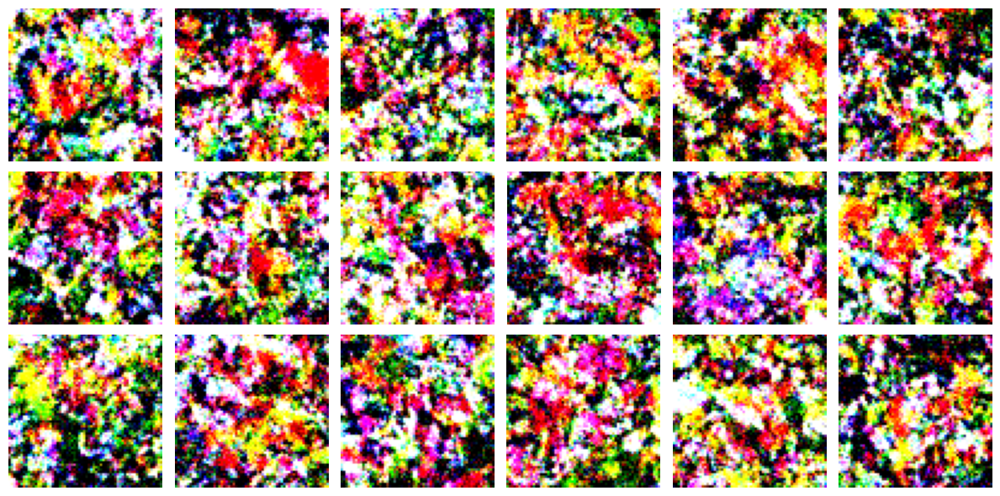

279/279 [==============================] - 48s 170ms/step - n_loss: 0.1500 - i_loss: 0.2488 - val_n_loss: 0.2641 - val_i_loss: 0.6577 - val_kid: 1.3479
Epoch 2/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1501 - i_loss: 0.2500

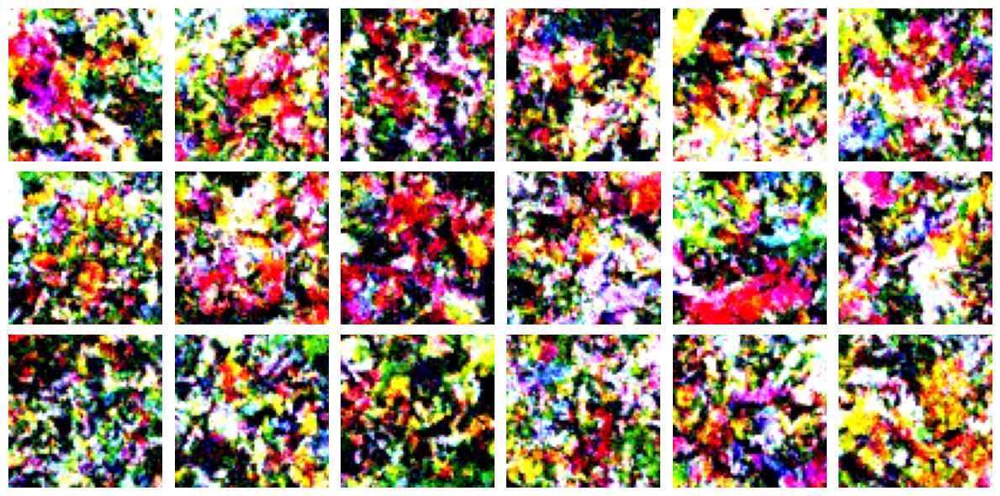

279/279 [==============================] - 46s 167ms/step - n_loss: 0.1501 - i_loss: 0.2500 - val_n_loss: 0.2307 - val_i_loss: 0.5524 - val_kid: 1.3747
Epoch 3/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1494 - i_loss: 0.2468

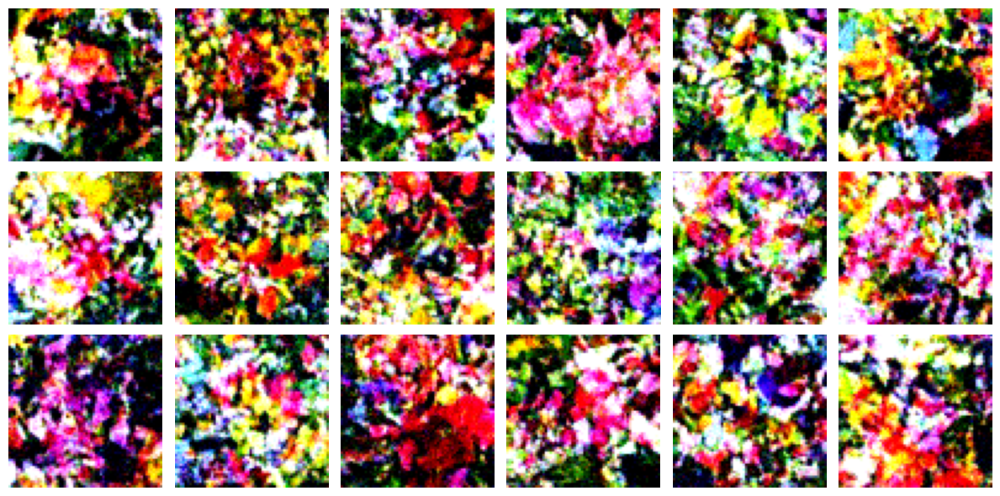

279/279 [==============================] - 47s 169ms/step - n_loss: 0.1494 - i_loss: 0.2468 - val_n_loss: 0.2072 - val_i_loss: 0.4493 - val_kid: 1.2581
Epoch 4/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1485 - i_loss: 0.2465

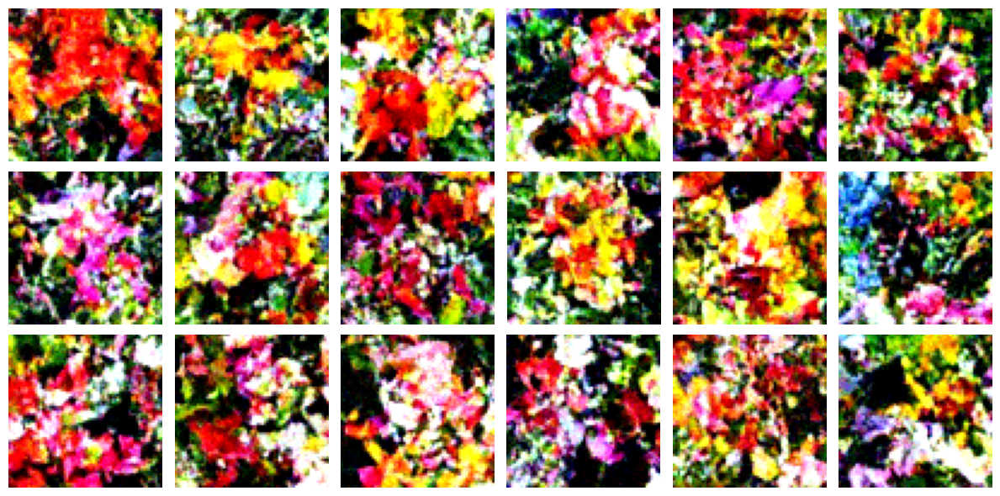

279/279 [==============================] - 47s 170ms/step - n_loss: 0.1485 - i_loss: 0.2465 - val_n_loss: 0.1890 - val_i_loss: 0.3931 - val_kid: 1.0923
Epoch 5/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1488 - i_loss: 0.2448

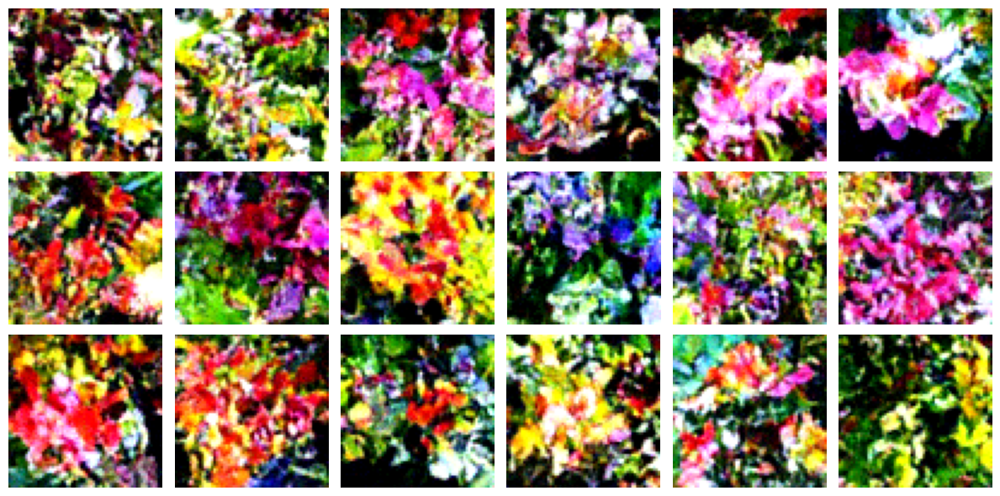

279/279 [==============================] - 47s 169ms/step - n_loss: 0.1488 - i_loss: 0.2448 - val_n_loss: 0.1768 - val_i_loss: 0.3450 - val_kid: 0.9796
Epoch 6/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1474 - i_loss: 0.2456

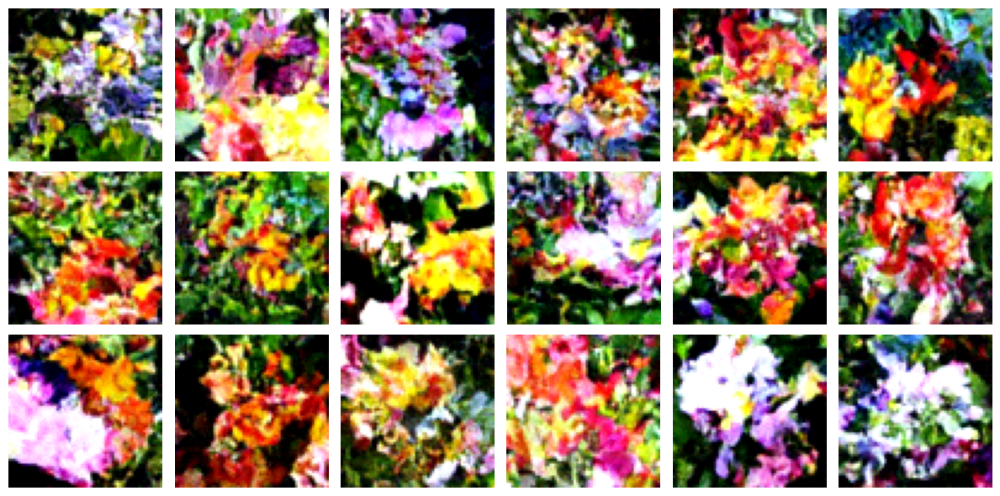

279/279 [==============================] - 47s 168ms/step - n_loss: 0.1474 - i_loss: 0.2456 - val_n_loss: 0.1660 - val_i_loss: 0.3160 - val_kid: 0.9078
Epoch 7/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1472 - i_loss: 0.2454

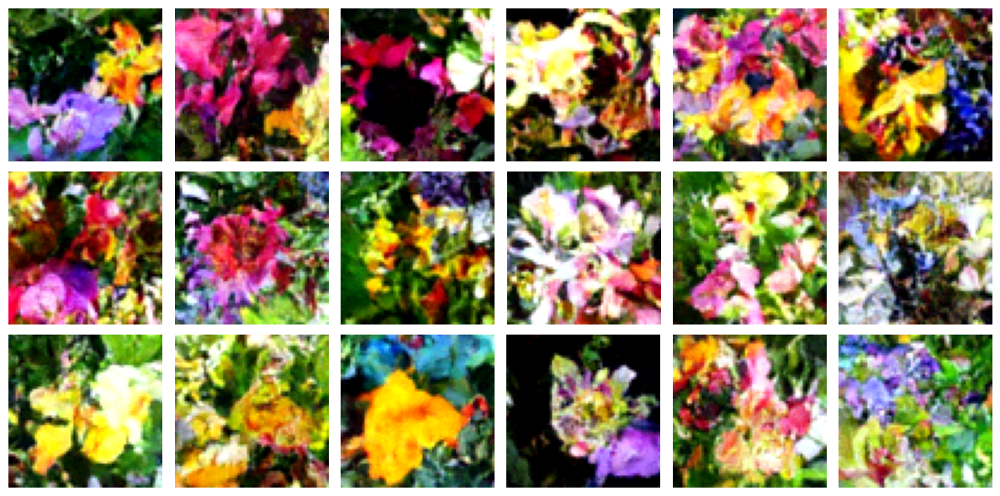

279/279 [==============================] - 48s 171ms/step - n_loss: 0.1472 - i_loss: 0.2454 - val_n_loss: 0.1587 - val_i_loss: 0.2879 - val_kid: 0.8481
Epoch 8/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1474 - i_loss: 0.2431

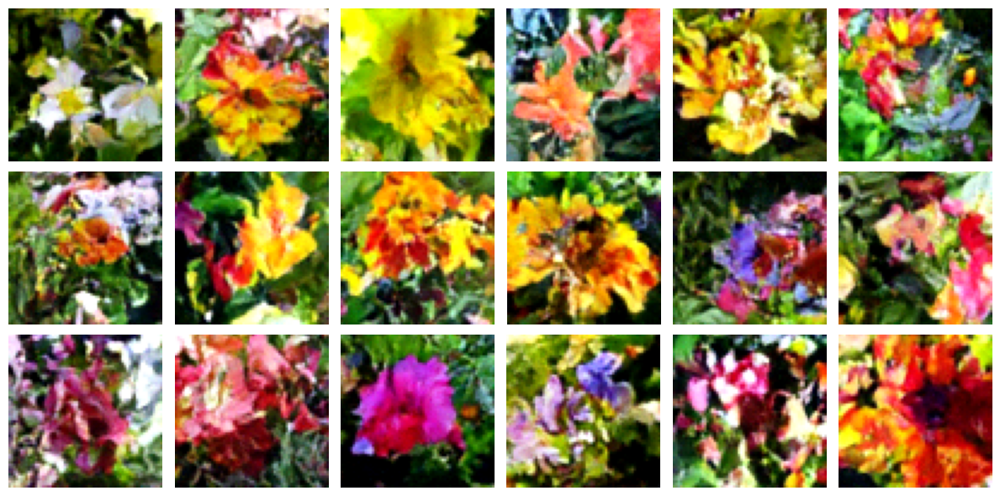

279/279 [==============================] - 46s 167ms/step - n_loss: 0.1474 - i_loss: 0.2431 - val_n_loss: 0.1555 - val_i_loss: 0.2702 - val_kid: 0.7975
Epoch 9/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1477 - i_loss: 0.2415

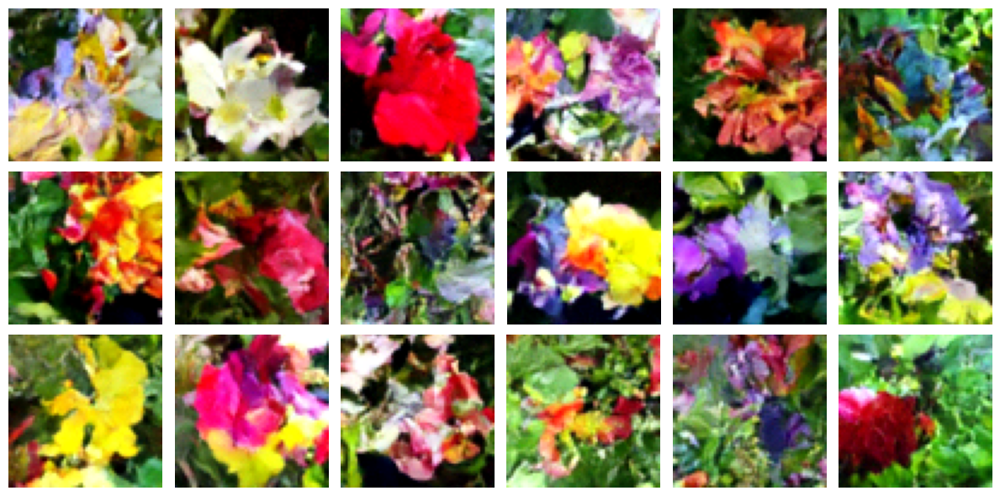

279/279 [==============================] - 47s 169ms/step - n_loss: 0.1477 - i_loss: 0.2415 - val_n_loss: 0.1526 - val_i_loss: 0.2569 - val_kid: 0.7449
Epoch 10/10
279/279 [==============================] - ETA: 0s - n_loss: 0.1469 - i_loss: 0.2411

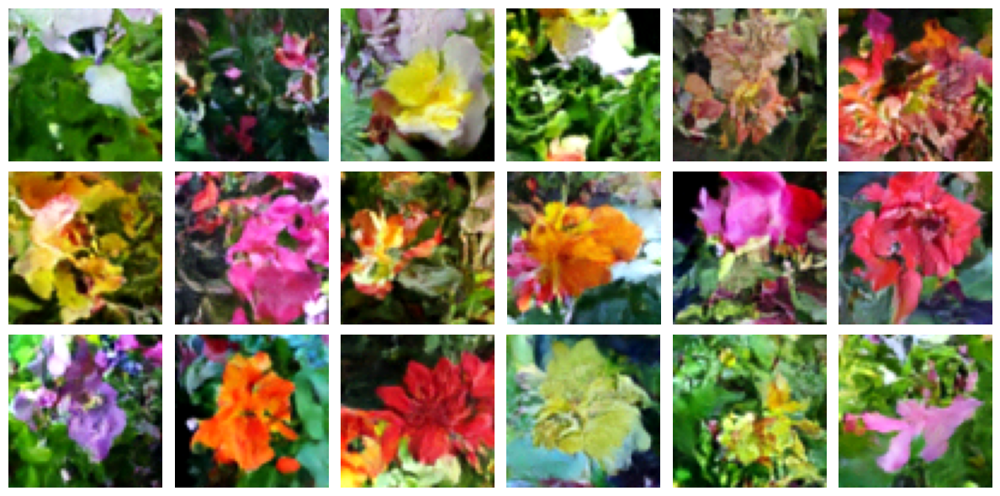

279/279 [==============================] - 48s 171ms/step - n_loss: 0.1469 - i_loss: 0.2411 - val_n_loss: 0.1500 - val_i_loss: 0.2500 - val_kid: 0.6904


In [16]:
# run training and plot generated images periodically
model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=num_epochs,
    callbacks=[
        keras.callbacks.LambdaCallback(on_epoch_end=model.plot_images),
        checkpoint_callback,
    ],
)

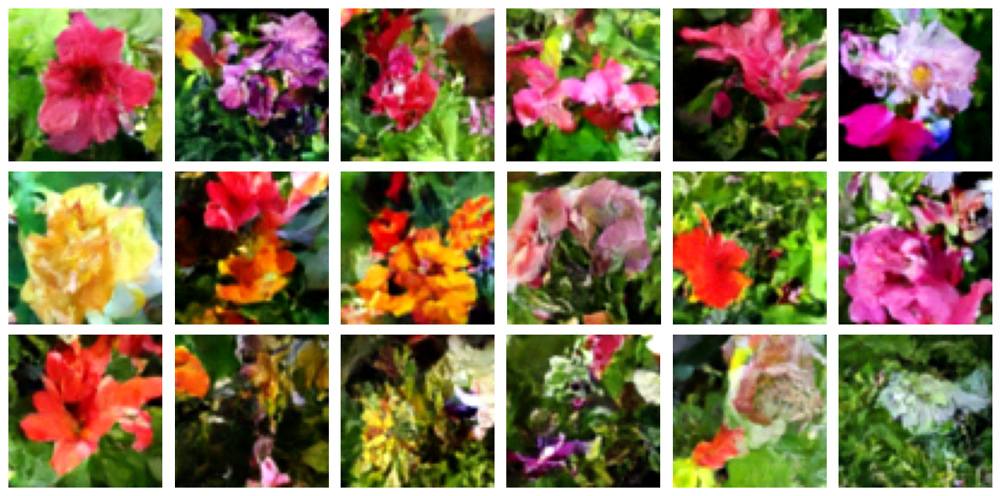

In [17]:
# load the best model and generate images
model.load_weights(checkpoint_path)
model.plot_images()

# Report

## `diffusion_schedule`

I follow the GIF shown to implement the `diffusion_schedule`.
One thing notable is that we should clip the angle with the `arc cosine` of max signal rate and min signal rate.

## `denoise`

Select `self.network` for training and the averaged model `self.ema_network` for inference.
Then predict the noises and compute the image with the parameters.

## `reverse_diffusion`

Declare the time steps and get noise and signal rates, then iteratively reverse the diffusion process.
